This notebook is ran on sdf ondemand environment.
The kernel I select was lsst_ditrib@v23.0.0

This notebook was evloved from Johnney's `lsst-treeRing/PaperFigures.ipynb`

In [1]:
! eups list -s lsst_distrib

   23.0.0+e2b4167800 	v23_0_0 o_latest current setup


In [2]:
!pwd

/sdf/home/y/youtsumi/Run5SensorEffects


In [3]:
!hostname

rome0094


In [4]:
%reset -f
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
plt.rc('image', interpolation='bicubic', origin='lower', cmap = 'viridis')
plt.rcParams["axes.formatter.useoffset"] = False
plt.rcParams['figure.figsize'] = [14.0, 10.0]
plt.rcParams['font.size'] = 16
rcParams = plt.rcParams.copy()

import matplotlib
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'

import posixpath, datetime, sys
import cv2

from scipy.stats import binned_statistic_2d, binned_statistic
from skimage.measure import block_reduce
from skimage.util import view_as_blocks
from scipy.ndimage.filters import gaussian_filter
import scipy.optimize as opt

#
from scipy.signal import butter, sosfilt
from astropy.stats import mad_std

import scipy.stats


In [5]:
import os
import glob
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from pylab import figure, cm
import traceback


In [6]:
def display(exposure,title=None):
    afwDisplay.setDefaultBackend('matplotlib') 
    fig = plt.figure(figsize=(10,10),facecolor="white")
    afw_display = afwDisplay.Display(1)
    afw_display.scale('asinh', 'zscale')
    afw_display.mtv(exposure.getImage())
    plt.title(title)
    plt.gca().axis('off')

In [7]:
import sys
sys.path.append("/sdf/group/lsst/camera/IandT/repo_gen3/spot_test_v2/u/youtsumi/202112/mixcoatl/python")
#sys.path.append('/sdf/home/y/youtsumi/lsst-treeRing')
from spotgrid_butler import SpotgridCatalog

In [8]:
from tree_ring_helper import *

centers = [[-335.49, 4095.84],[-156,-280],[4320,4180],[4627.47, -630.89]]

sensor_lims = {'e2v':[[0,4096],[0,4004]],'ITL':[[0,4072],[0,4000]]}

In [9]:
def proj_to_polar_coord(t,vx,vy):
    vr = np.cos(t)*vx + np.sin(t)*vy
    vt = -np.sin(t)*vx+ np.cos(t)*vy
    return vr, vt

def proj_to_polar_coord_spin2(t,vx,vy):
    vr = np.cos(2*t)*vx + np.sin(2*t)*vy
    vt = np.sin(2*t)*vx - np.cos(2*t)*vy
    return vr, vt

def trasnform_to_polar_coord(x,y,x0=0.,y0=0.,deg=False):
    r = np.hypot((x-x0),(y-y0))
    t = np.arctan2((y-y0),(x-x0))
    
    if deg: t *= (180 / np.pi)
    return r,t

In [10]:
# This cell comes from tree_ring_helper.py to override for handy

sensor_lims = {'e2v':[[0,4096],[0,4004]],'ITL':[[0,4072],[0,4000]]}

from astropy.stats import SigmaClip
sigclip = SigmaClip(sigma=5, maxiters=1)

# filter out exposures that have large scatter....

def generate_image(self,var,MAX=0.07,fradius=140,sensor='e2v'):
    
    nanmask = np.isfinite(self.deltaXX)  #masks all the NaN entries created when a catalog didn't have 2401 entries
    xxfltr_flat = self.xxfltr[nanmask].flatten()
    yyfltr_flat = self.yyfltr[nanmask].flatten()
    
    # see eqns 2,3 in https://arxiv.org/pdf/1710.01819.pdf
    if sensor=="e2v":
        xc,yc = centers[2]
#        xc,yc = centers[3]
    else:
        xc,yc = centers[3]

    r, t = trasnform_to_polar_coord(self.xfltr_flat,self.yfltr_flat, x0=xc, y0=yc)
    de  = self.dXX+self.dYY
    de1 = self.dXX-self.dYY
    de2 = np.sqrt( de1**2 + 4*self.dXY**2 )
    de3 = 2*self.dXY
    der,det= proj_to_polar_coord_spin2(t,de1,de3)
    
    dmap = {'dT':self.dT/(xxfltr_flat+yyfltr_flat),
            'dXX':self.dXX/(xxfltr_flat),
            'dYY':self.dYY/(yyfltr_flat),
            'dXY':self.dXY,
            'dX':self.dX,
            'dY':self.dY,
            'dg1':self.dg1,
            'dg2':self.dg2,
            'dF':self.dF,
            'dF/F':self.dF,
            'dr':self.dR,
            'dtheta':self.dT,
#            'dgr':self.dgr,
#            'dgt':self.dgt,
            'de' : de /(xxfltr_flat+yyfltr_flat),
            'de1': de1/(xxfltr_flat+yyfltr_flat),
            'de2': de2/(xxfltr_flat+yyfltr_flat),
            'de3': de3/(xxfltr_flat+yyfltr_flat),
            'der': der/(xxfltr_flat+yyfltr_flat),
            'det': det/(xxfltr_flat+yyfltr_flat),
            'd|e|': np.sqrt(der**2+det**2)/(xxfltr_flat+yyfltr_flat),
            
           }
    
    nbins = 400
    bins = [407,400] #approx. 10x10 px^2 binning

    dT_mean, x_edge, y_edge, binidx = binned_statistic_2d(
                                    self.xfltr_flat,
                                    self.yfltr_flat,
                                    dmap[var],
#                                    sigclip(dmap[var],axis=0,masked=False),
#                                    np.nanmean,
                                    lambda x: scipy.stats.norm.fit(x[np.isfinite(x)])[0],
                                    range=sensor_lims[self.sensor], bins=bins)
                                     #mean is significantly faster calculation
        
    ## cut borders
    mask    = mask_borders(self,x_edge,y_edge,dT_mean,MAX=MAX,fradius=fradius)
    
    ## sensor max limits
    xmax = sensor_lims[self.sensor][0][1]
    ymax = sensor_lims[self.sensor][1][1]
    
    ## resize image
    resized     = cv2.resize(dT_mean.T,(xmax,ymax), interpolation = cv2.INTER_AREA)
    resized_cut = cv2.resize(mask.T   ,(xmax,ymax), interpolation = cv2.INTER_AREA)
    
    return dT_mean,resized,resized_cut

In [13]:
repo25 = '/sdf/group/lsst/camera/IandT/repo_gen3/BOT_data/butler.yaml'
repo9 = '/sdf/group/lsst/camera/IandT/repo_gen3/spot_9raft/butler.yaml'

results = []
for setting in [
    (repo25, 'u/snyder18/spot_13242/gridfit_run1', 'u/snyder18/spot_13242/gridcalibration'),
    (repo25, 'u/snyder18/spot_13243/gridfit_run1', 'u/snyder18/spot_13243/gridcalibration'),
    (repo25, 'u/snyder18/spot_13237/gridfit_run1', 'u/snyder18/spot_13237/gridcalibration'),
    (repo25, 'u/snyder18/spot_13246/gridfit_run1', 'u/snyder18/spot_13246/gridcalibration'),
    (repo9, 'u/asnyder/spot/e2v_analysis', 'u/asnyder/spot/e2v_calibration'),        
    (repo9, 'u/asnyder/spot/itl_analysis', 'u/asnyder/spot/itl_calibration')
    ]:
    try:
        asensor = SpotgridCatalog(*setting)

        asensor.get_calibration_table()
        asensor.load_data()
        asensor.compute_statistics()
        asensor.filter_spots(value=.4)   # value=.4
        asensor.compute_spotgrid()
        asensor.calibrate()

        xc,yc = centers[2]

        r, t = trasnform_to_polar_coord(asensor.xfltr,asensor.yfltr, x0=xc, y0=yc)

        dr,dt= proj_to_polar_coord(t,asensor.deltaX,asensor.deltaY)
        dgr,dgt= proj_to_polar_coord_spin2(t,asensor.deltag1,asensor.deltag2)

        nanmask = np.isfinite(asensor.deltaXX)

        asensor.dR = dr[nanmask].flatten()
        asensor.dt = dt[nanmask].flatten()

        asensor.dgr= dgr[nanmask].flatten()
        asensor.dgt= dgt[nanmask].flatten()
        results.append(asensor)
    except:
        traceback.print_exc()

Repository        : /sdf/group/lsst/camera/IandT/repo_gen3/BOT_data/butler.yaml
catalog collection: u/snyder18/spot_13242/gridfit_run1
calib collection  : u/snyder18/spot_13242/gridcalibration


Found tmp/r03_s12_x_arr.npy
Found tmp/r03_s12_y_arr.npy
Found tmp/r03_s12_xx_arr.npy
Found tmp/r03_s12_xy_arr.npy
Found tmp/r03_s12_yy_arr.npy
Found tmp/r03_s12_dx_arr.npy
Found tmp/r03_s12_dy_arr.npy
Found tmp/r03_s12_dxx_arr.npy
Found tmp/r03_s12_dyy_arr.npy
Found tmp/r03_s12_dxy_arr.npy
Found tmp/r03_s12_instFlux_arr.npy
Found tmp/r03_s12_instFluxErr_arr.npy
Found tmp/r03_s12_x_center_arr.npy
Found tmp/r03_s12_y_center_arr.npy
Found tmp/r03_s12_dFlux_arr.npy
Found tmp/r03_s12_dg1_arr.npy
Found tmp/r03_s12_dg2_arr.npy
Loading data for ITL tmp/r03_s12.
Computing statistics for ITL tmp/r03_s12.
Computing filter spots for ITL tmp/r03_s12.


Repository        : /sdf/group/lsst/camera/IandT/repo_gen3/BOT_data/butler.yaml
catalog collection: u/snyder18/spot_13243/gridfit_run1
calib collection  : u/snyder18/spot_13243/gridcalibration


Found tmp/r10_s11_x_arr.npy
Found tmp/r10_s11_y_arr.npy
Found tmp/r10_s11_xx_arr.npy
Found tmp/r10_s11_xy_arr.npy
Found tmp/r10_s11_yy_arr.npy
Found tmp/r10_s11_dx_arr.npy
Found tmp/r10_s11_dy_arr.npy
Found tmp/r10_s11_dxx_arr.npy
Found tmp/r10_s11_dyy_arr.npy
Found tmp/r10_s11_dxy_arr.npy
Found tmp/r10_s11_instFlux_arr.npy
Found tmp/r10_s11_instFluxErr_arr.npy
Found tmp/r10_s11_x_center_arr.npy
Found tmp/r10_s11_y_center_arr.npy
Found tmp/r10_s11_dFlux_arr.npy
Found tmp/r10_s11_dg1_arr.npy
Found tmp/r10_s11_dg2_arr.npy
Loading data for ITL tmp/r10_s11.
Computing statistics for ITL tmp/r10_s11.
Computing filter spots for ITL tmp/r10_s11.
Repository        : /sdf/group/lsst/camera/IandT/repo_gen3/BOT_data/butler.yaml
catalog collection: u/snyder18/spot_13237/gridfit_run1
calib collection  : u/sn

/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:366: RuntimeWarning: Mean of empty slice.
  loc = data.mean()
/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:371: RuntimeWarning: Mean of empty slice.
  scale = np.sqrt(((data - loc)**2).mean())


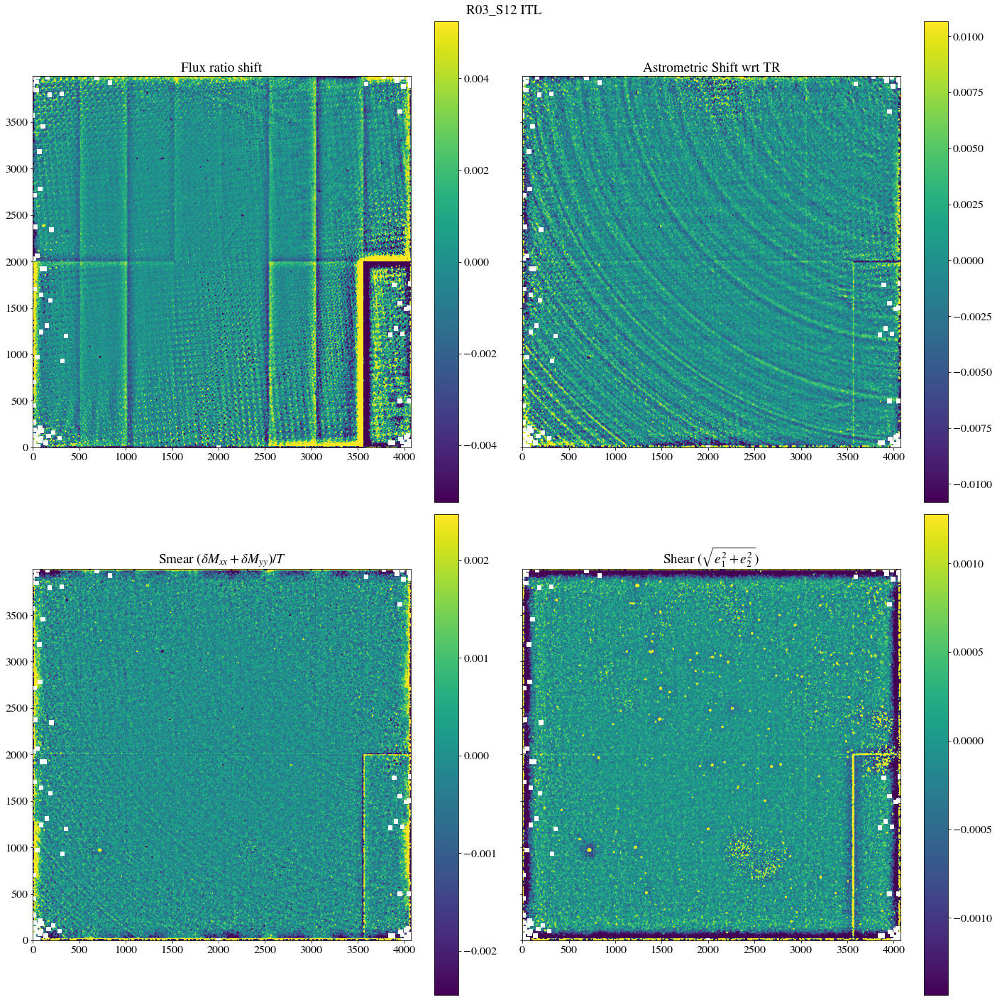

0.0017469397538946003
0.003579937333440832
0.0008205319679083014
0.00045197104031382906


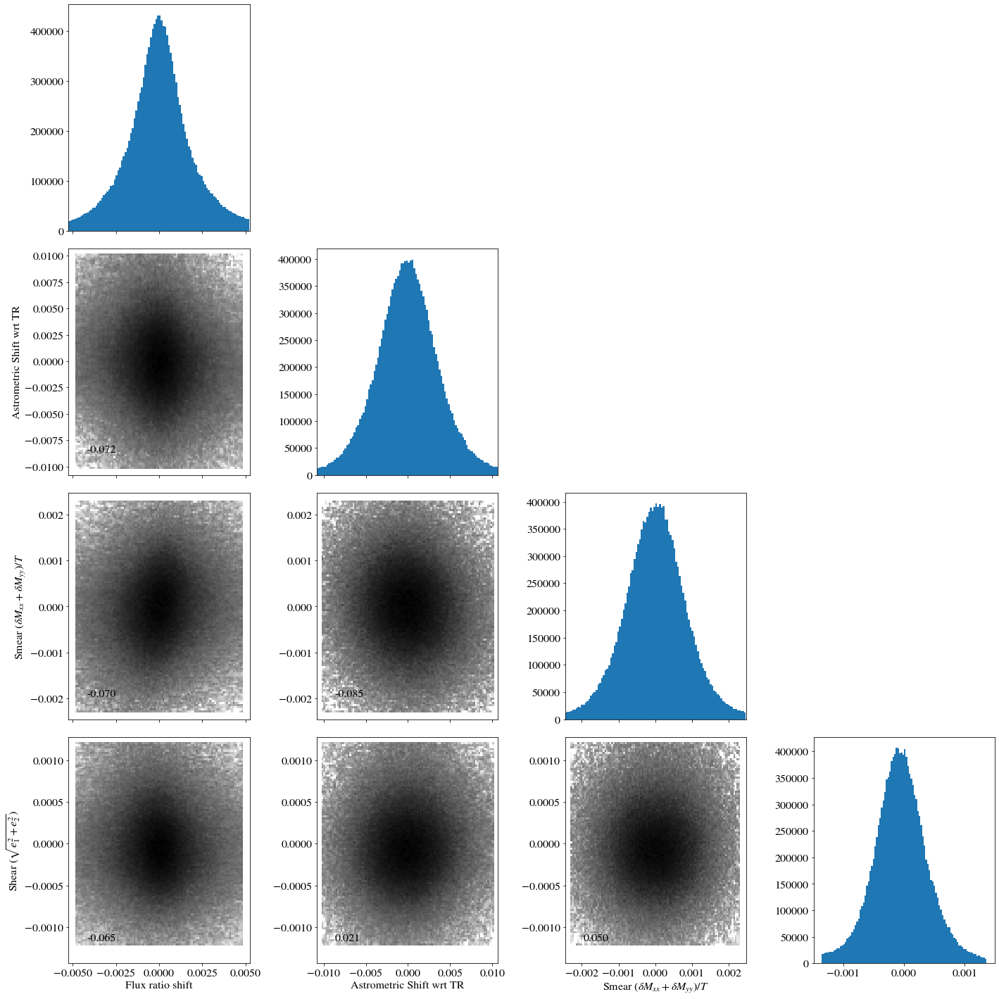

/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:366: RuntimeWarning: Mean of empty slice.
  loc = data.mean()
/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/cvmfs/sw.lsst.eu/linux-x86_64/lsst_distrib/v23.0.0/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe-0.7.0-ext/lib/python3.8/site-packages/scipy/stats/_continuous_distns.py:371: RuntimeWarning: Mean of empty slice.
  scale = np.sqrt(((data - loc)**2).mean())


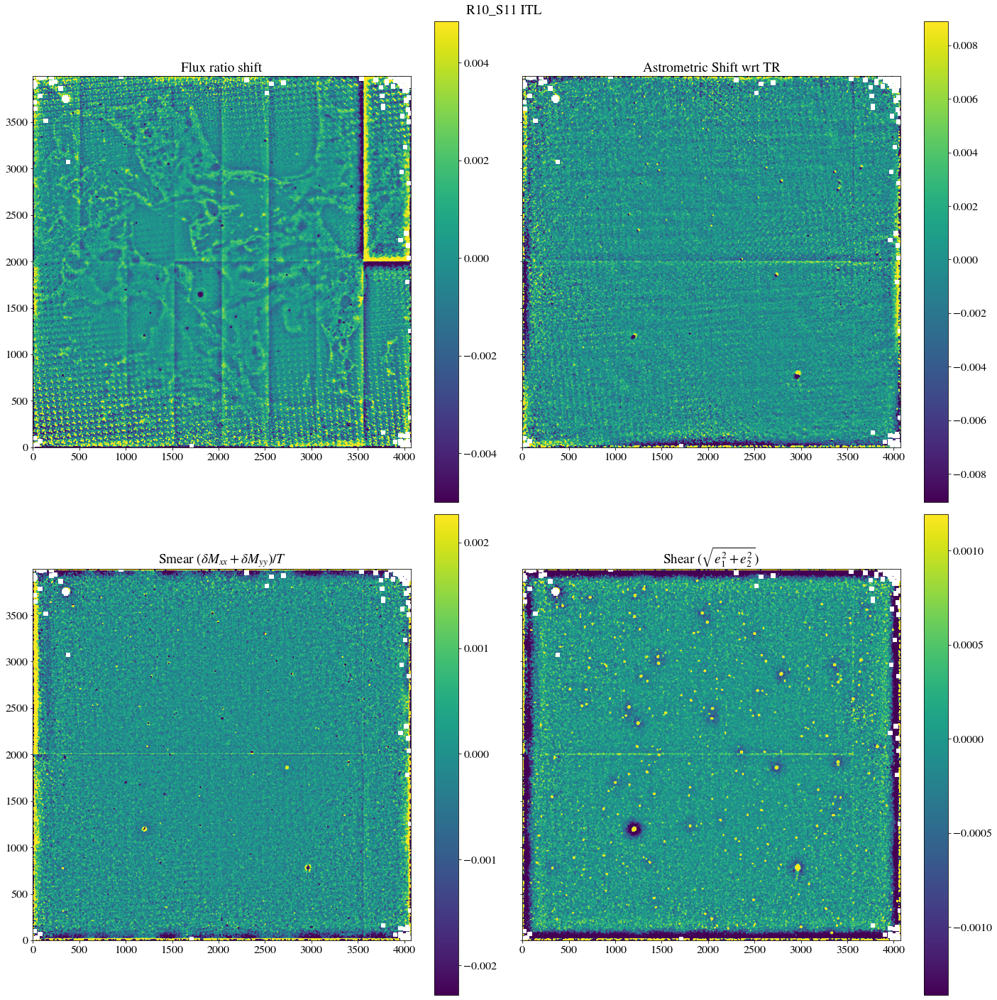

0.0016396951953897248
0.0029924945805187993
0.0007580071977861439
0.00042542904663477423


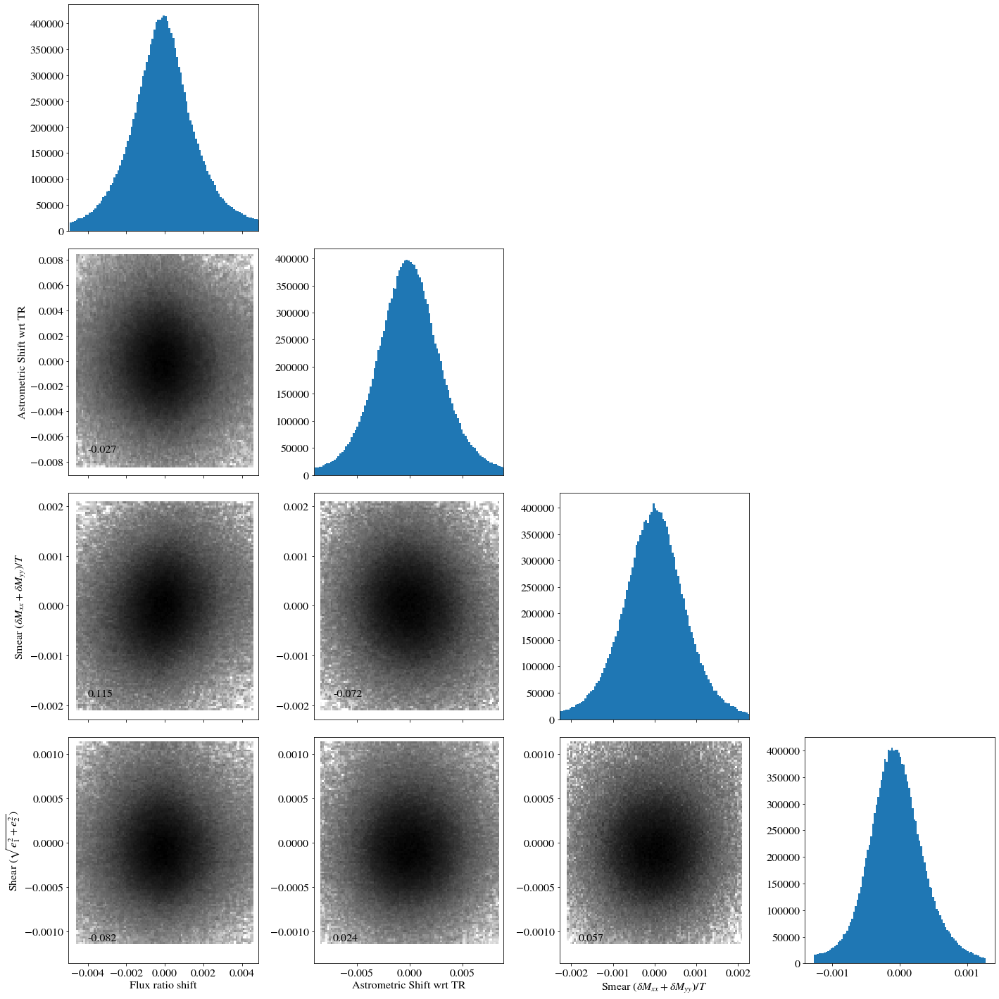

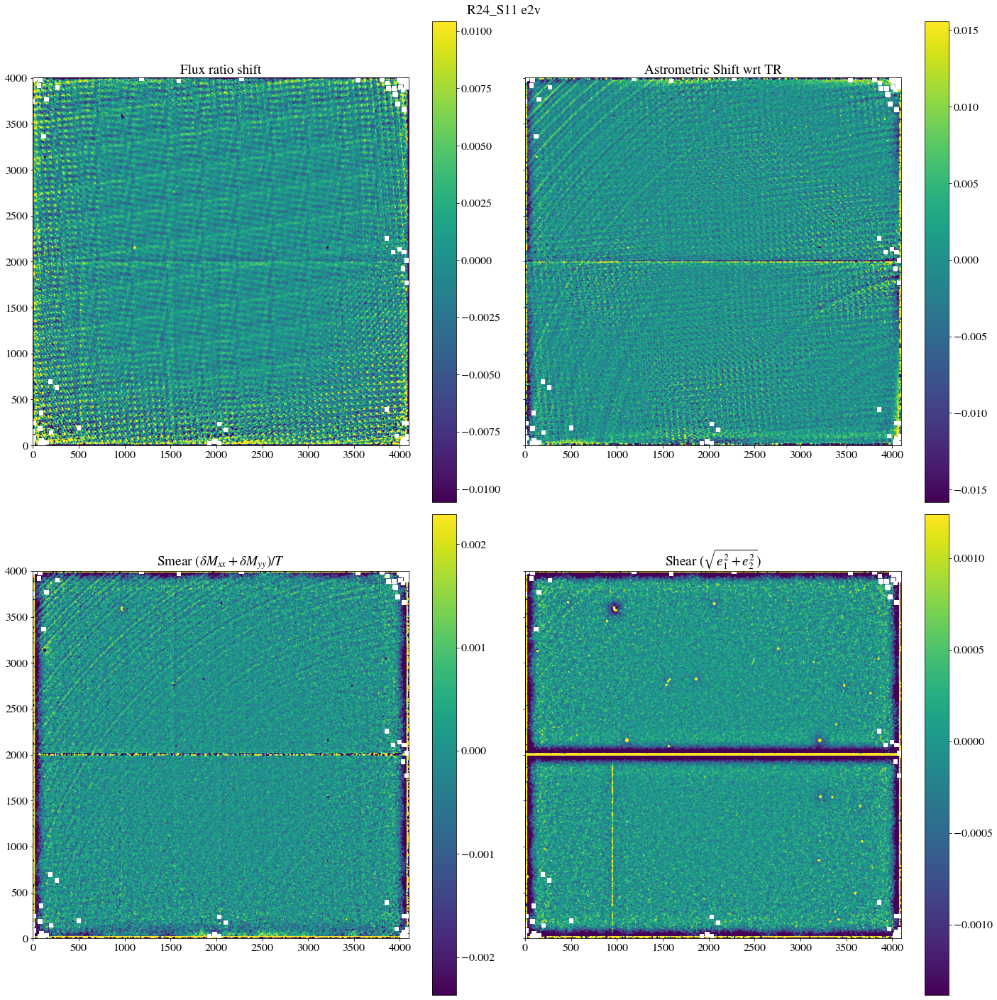

0.0035000098518075894
0.005234663243407234
0.0007756462199168072
0.0004373405214245267


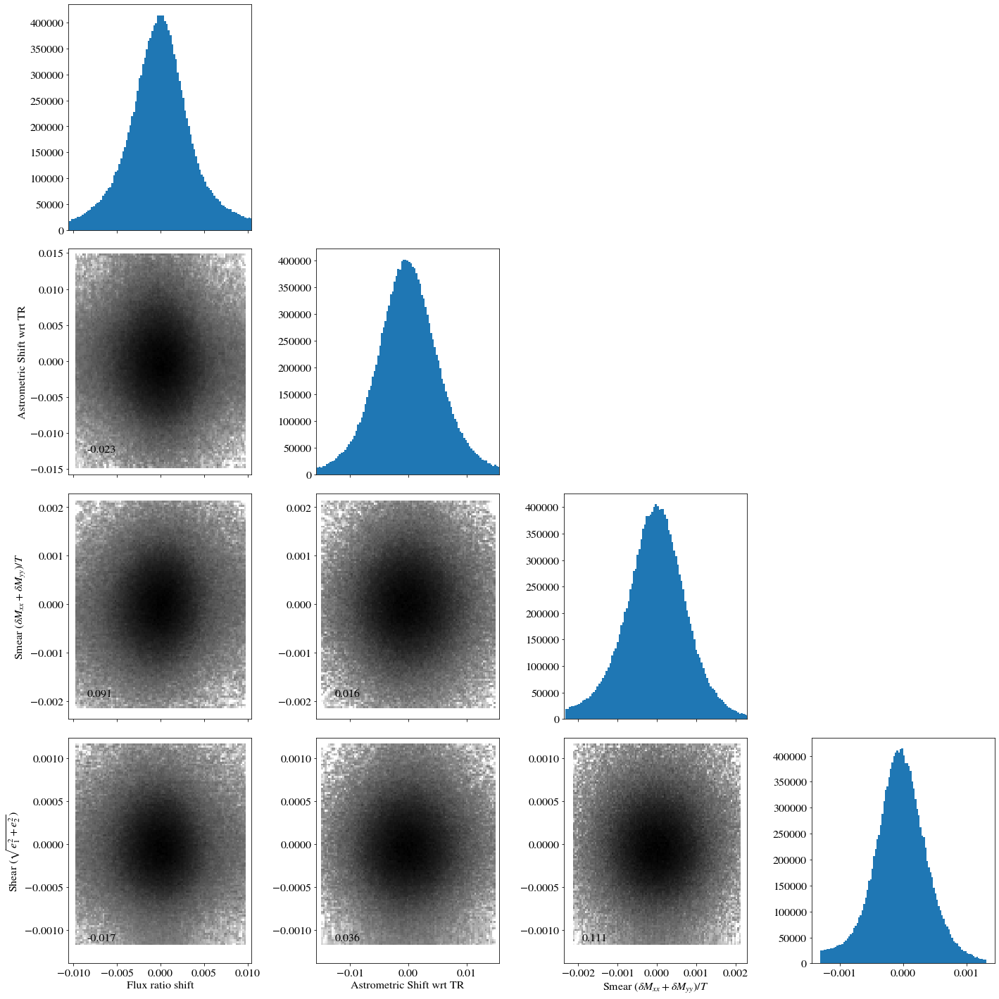

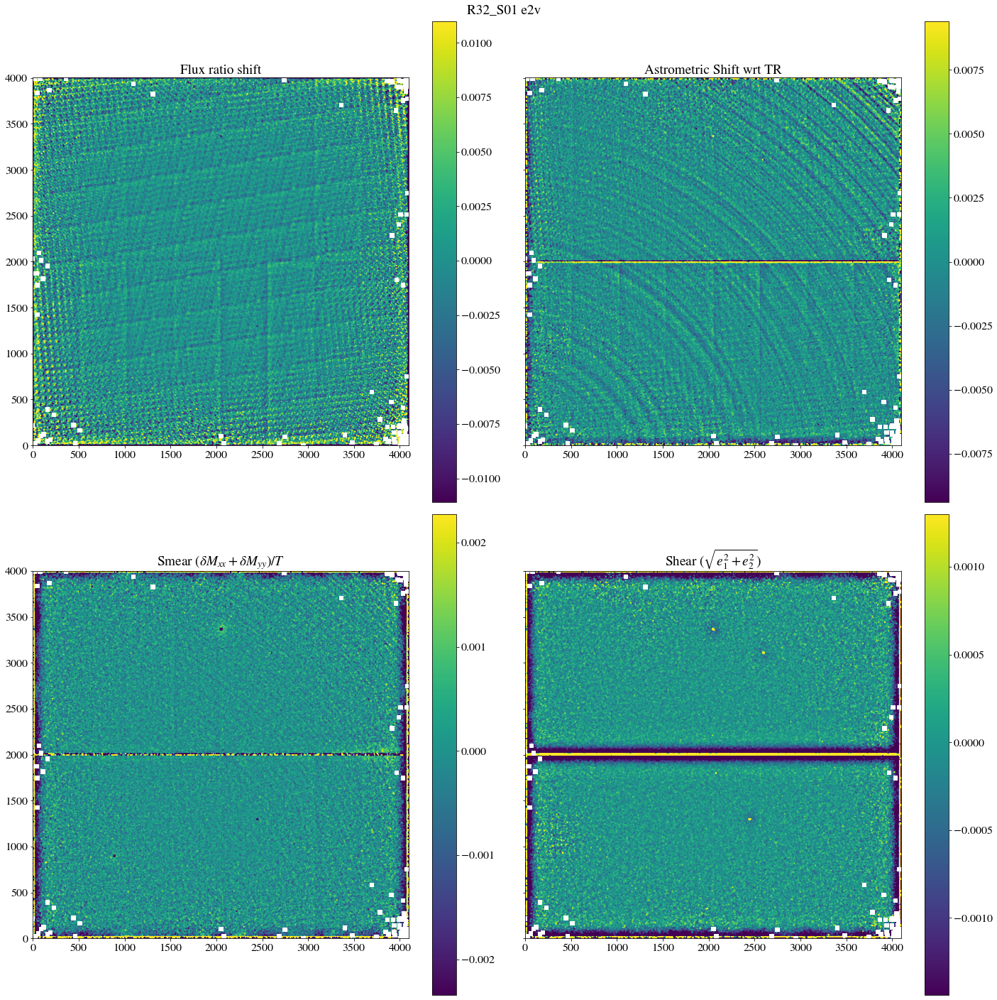

0.0036777712573065296
0.0031292901487832672
0.0007691303594263137
0.0004563997201496128


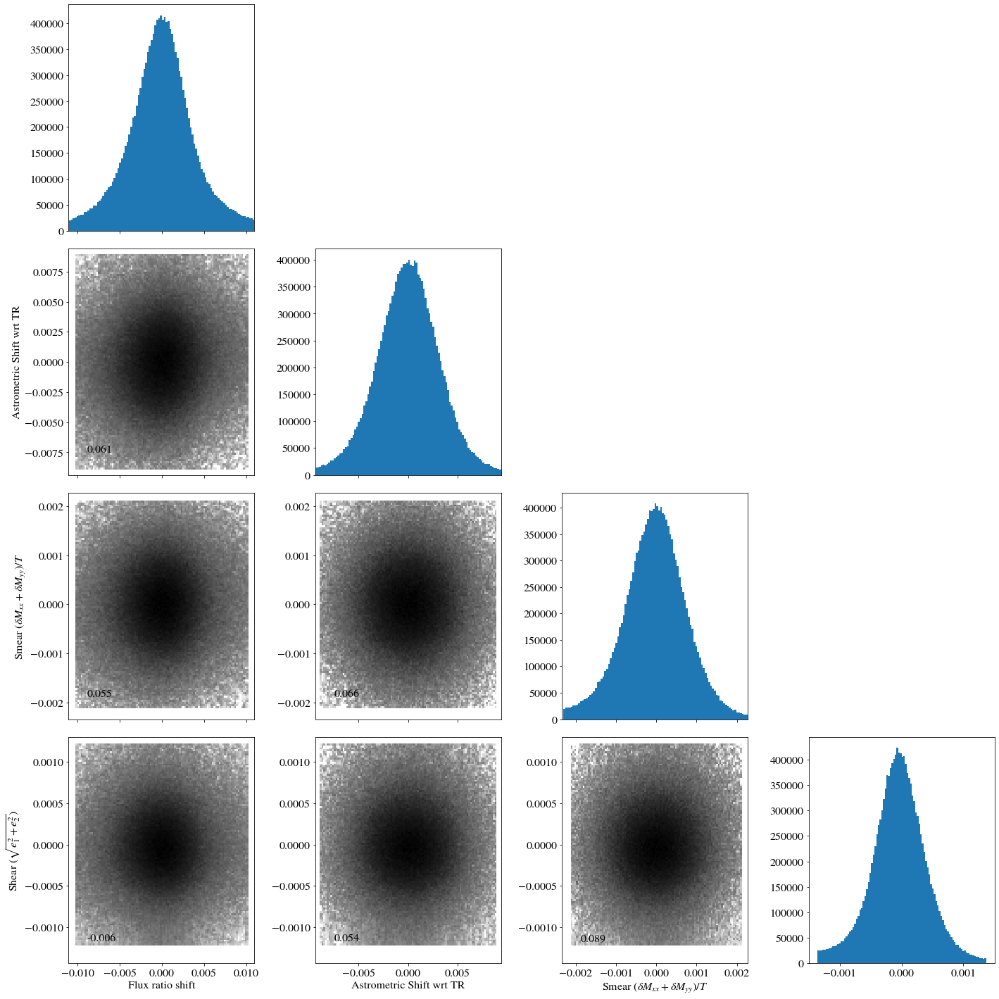

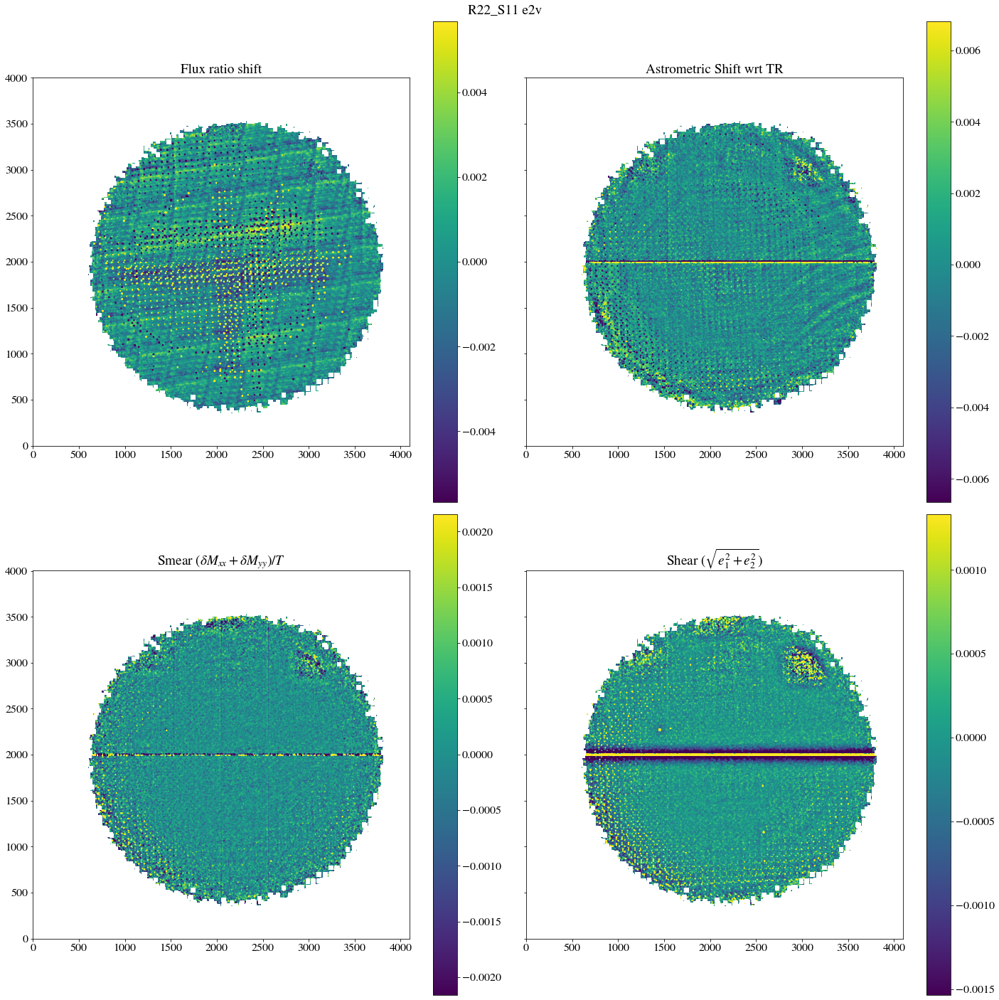

0.0018908226966310971
0.0022435847951953764
0.0007187679767925552
0.0004777864250207181


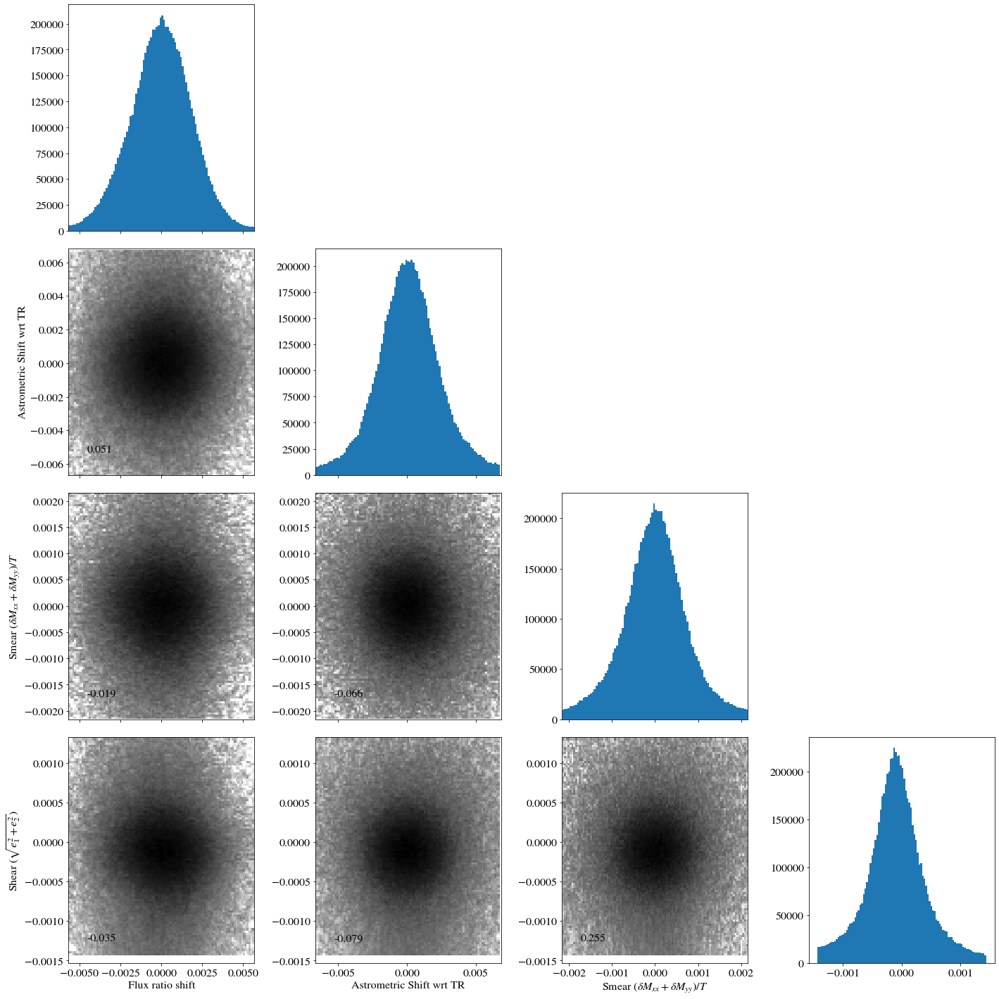

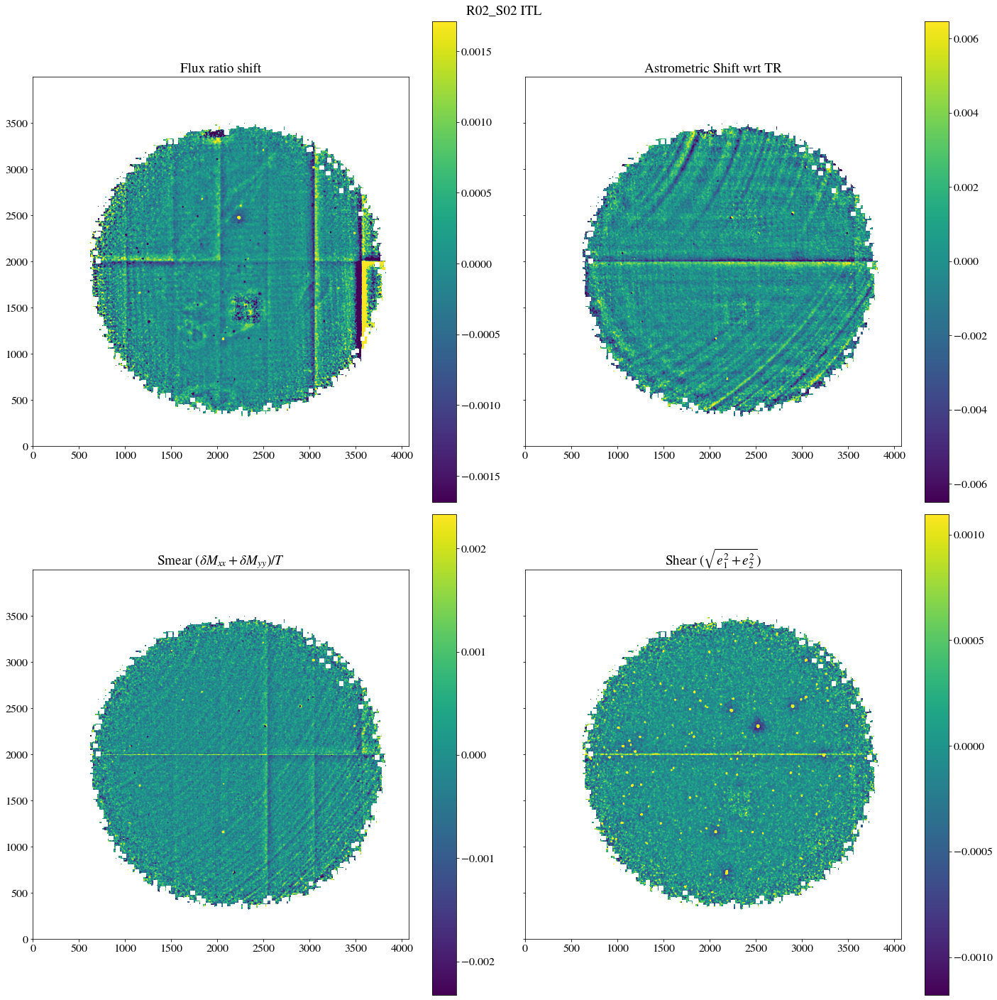

0.0005659275422191168
0.0021586455546534085
0.0007761098407936668
0.00037903237582894155


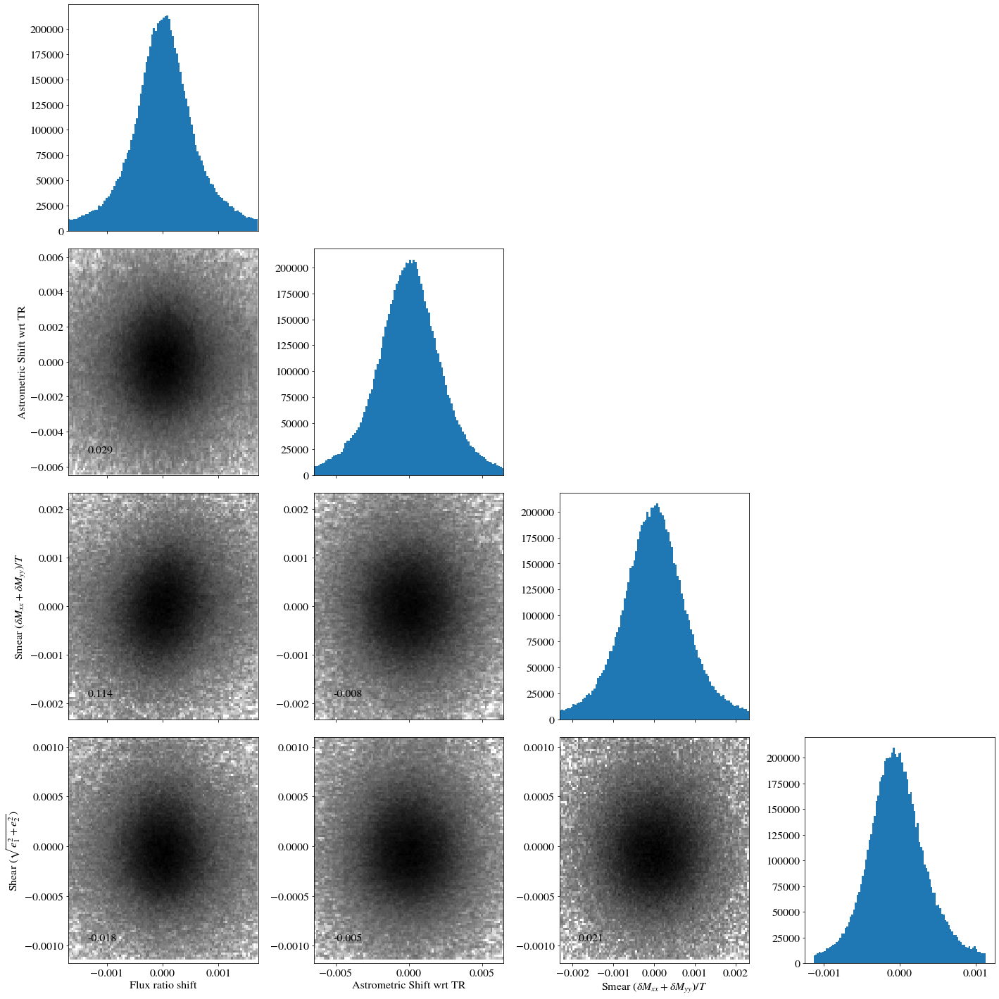

In [14]:
from astropy.stats import sigma_clipped_stats
from astropy.stats import SigmaClip
sigclip = SigmaClip(sigma=5, maxiters=1)

from scipy.ndimage import gaussian_filter
import seaborn as sns
from astropy.io import fits

keys = [
            ("dF",r"Flux ratio shift"),    
            ("dr",r"Astrometric Shift wrt TR"),
            ("de",r"Smear $(\delta M_{xx} + \delta M_{yy})/T$"),
#            ("de1","$e_1=(\delta M_{xx} - \delta M_{yy})/T$"),
            ("de2","Shear $(\sqrt{e_1^2 + e_2^2})$"),
#            ("de3","$e_2=2\delta M_{xy}/T$"),
#            ("der","$e_r$"),
#            ("det","$e_t$")
            ]

xlim = (-0.05,0.05)
n=3
func=lambda x: x
sigclip = SigmaClip(sigma=2*n, maxiters=0)

maparray = {}
for sensor in results:
    fig, axs = plt.subplots(2, 2, figsize=(20, 20), sharey='all', facecolor="white")

    fig.suptitle(f'{sensor.sensorbay.upper()} {sensor.sensor}')
    maps = {}
    for ax, key in zip(axs.flatten(), keys):
        _,_,img =  generate_image(sensor,key[0],fradius=1000)
#        img_filtered = gaussian_filter(img,3)
        img_filtered = apply_filter(img, 250, power=4) # power was 4
        maps[key[0]] = img_filtered
        ax.set_title(key[1])
#        a=ax.imshow(img_filtered,vmin=-0.001,vmax=0.001)
        std=mad_std(img_filtered, ignore_nan=True)
        m=np.nanmedian(img_filtered)
        a=ax.imshow(img_filtered,vmin=m-n*std,vmax=m+n*std)
        fig.colorbar(a,ax=ax)

    fig.tight_layout()
    plt.show()
    
    fh = fits.HDUList(fits.PrimaryHDU())
    for amapkey in maps:
        fh.append(
            fits.ImageHDU(
                    maps[amapkey],
                    header=fits.Header({"mapname":amapkey})
                )
        )
    fh.writeto(f"map-{sensor.sensorbay}.fits",overwrite=True)
    maparray[sensor.sensor] = maps
    fig, axs = plt.subplots(len(keys), len(keys), figsize=(20, 20),
#                            sharey='all',
                            sharex='col',
                            facecolor="white")
    for i in range(len(keys)):
        for j in range(len(keys)):
            if i<j:
                axs[i][j].axis('off')
            elif i==j:
                std=mad_std(maps[keys[j][0]], ignore_nan=True)
                print(std)
                axs[i][j].hist(maps[keys[j][0]].flatten(),
                               bins=(100),range=(-n*std,n*std))
                continue
            else:
                x=func(maps[keys[j][0]][100:-100,100:-100].flatten())
                y=func(maps[keys[i][0]][100:-100,100:-100].flatten())
                sx = mad_std(x, ignore_nan=True)
                sy = mad_std(y, ignore_nan=True)                
                axs[i][j].hist2d(x, y, bins=(100, 100), range=[[-n*sx,n*sx],[-n*sy,n*sy]],
                                 norm=matplotlib.colors.LogNorm(), cmap=plt.cm.Greys)                
                axs[i][j].annotate( f"{np.nanmean(x*y)/(np.nanstd(x)*np.nanstd(y)):.3f}", (0.1,0.1), xycoords="axes fraction" )
#                axs[i][j].scatter(maps[keys[j][0]].flatten()[::10],maps[keys[i][0]].flatten()[::10],marker=".",s=0.1,alpha=0.1)
            if i==len(keys)-1:
                std=mad_std(maps[keys[j][0]], ignore_nan=True)
                m=np.nanmedian(maps[keys[j][0]])
                axs[i][j].set_xlim(-n*std+m,n*std+m)
                axs[i][j].set_xlabel(keys[j][1])
            if j==0 and i!=0:
                axs[i][j].set_ylabel(keys[i][1])
            m=np.nanmedian(maps[keys[i][0]])
            std=mad_std(maps[keys[i][0]], ignore_nan=True)
            axs[i][j].set_ylim(-n*std+m,n*std+m)
#                axs[i][j].set_xlim(*xlim)
#                axs[i][j].set_ylim(-0.05,0.05)
            
    fig.tight_layout()
    plt.show()